In [ ]:
!pip install geopandas
!pip install contextily
!pip install pyxlsb
!pip install mapclassify
!pip install inference_sdk

import matplotlib.pyplot as plt
import matplotlib.colors as mc
import numpy as np
import pandas as pd
import os
import zipfile
import sys

from pathlib import Path
import cv2
from imutils import build_montages
from imutils import paths
import random

from google.colab.patches import cv2_imshow
import yaml

%matplotlib inline
import geopandas as gpd
import contextily as cx
import glob

from matplotlib.offsetbox import OffsetImage, AnnotationBbox

In [ ]:
from inference_sdk import InferenceHTTPClient, InferenceConfiguration

# Initialize Roboflow Client w/ API Key
GLOBAL_CLIENT = InferenceHTTPClient(
    api_url="https://serverless.roboflow.com",
    api_key="M5rkWAuwydj3zNZFpyDf"
)

def get_all_bounding_boxes(image_path, model_id ="count-annotations-4/3", confidence_threshold=0.01):
    """
    Extract all bounding boxes from an image using the specified model.
    Can handle both file paths (strings) and numpy arrays (image data).
    """
    # Configure confidence threshold
    configuration = InferenceConfiguration(confidence_threshold=confidence_threshold)
    GLOBAL_CLIENT.configure(configuration)

    # Check if input is a numpy array or file path
    if isinstance(image_path, np.ndarray):
        # It's already an image array
        img = image_path
        inference_input = image_path  # Roboflow can handle numpy arrays directly
    else:
        # It's a file path
        img = cv2.imread(image_path)
        if img is None:
            print(f"Could not load image: {image_path}")
            return []
        inference_input = image_path

    h_img, w_img = img.shape[:2]

    # Get predictions from the model
    predictions = GLOBAL_CLIENT.infer(inference_input, model_id=model_id)

    if not predictions or 'predictions' not in predictions:
        return []

    all_boxes = []
    for prediction in predictions['predictions']:
        xc = prediction['x']
        yc = prediction['y']
        w = prediction['width']
        h = prediction['height']
        box = [
            int(xc - w/2),
            int(yc - h/2),
            int(prediction['width']),
            int(prediction['height']),
            prediction['confidence'],
            prediction['class']
        ]
        all_boxes.append(box)

    # Sort boxes by position
    sorted_list = sorted(all_boxes, key=lambda x: x[0] + x[1] * h_img)
    return sorted_list

def get_classification(image_path, model_id, confidence_threshold=0.01):
    """
    Get classification result from an image using the specified model
    """
    # Configure confidence threshold (reuse existing client)
    configuration = InferenceConfiguration(confidence_threshold=confidence_threshold)
    GLOBAL_CLIENT.configure(configuration)

    # Get predictions from the model and return directly
    predictions = GLOBAL_CLIENT.infer(image_path, model_id=model_id)

    return predictions['top']

def num_SD(bb_img):
  """
  Use a classification model to return the single-digit number
  """
  x = get_classification(bb_img, "digitclassification/2")
  if x == 'Unlabeled':
    return -1
  return (int(x))

def num_MD(bb_img):
  """
  Use a classification model to return the double-digit number
  Done by identifying the ten and unit digits individually
  """

  # Generate all bounding boxes with a 1% confidence threshold
  all_boxes = get_all_bounding_boxes(bb_img, "doubledigit/2")

  # List of all bounding boxes of unit digits
  unit_boxes = [box for box in all_boxes if box[5] == 'Unit']

  if unit_boxes:
    # Find the unit digit bounding box with the highest confidence
    bb_unit = max(unit_boxes, key=lambda x: x[4])

    [x, y, w, h, conf, cls] = bb_unit
    unit_crop = bb_img[y:y+h, x:x+w]
    num_unit = int(get_classification(unit_crop, "digitclassification/2"))
  else:
    num_unit = 0 # If no bounding box of unit digit, assumer 0

  # List of all bounding boxes of unit digits
  ten_boxes = [box for box in all_boxes if box[5] == 'Ten']

  if ten_boxes:
    # Find the ten digit bounding box with the highest confidence
    bb_ten = max(ten_boxes, key=lambda x: x[4])

    [x, y, w, h, conf, cls] = bb_ten
    ten_crop = bb_img[y:y+h, x:x+w]
    num_ten = int(get_classification(ten_crop, "digitclassification/2")) * 10
  else:
    num_ten = 10 # If no bounding box of ten digit, assumer 1

  return num_ten + num_unit

def num_ST(bb_img):
  return 1

def num_MT(bb_img):
  """
  Use a classification model to return the double-digit number
  Done by identifying the ten and unit digits individually
  """

  # Two cases: a single-digit (not one) tent or a double-digit number within the tent

  if get_classification(bb_img, "tent-classification/1") == 'SDT':
    all_boxes = get_all_bounding_boxes(bb_img, "tentdigits-sd/1")
    bb_out = max(all_boxes, key = lambda x: x[4])

    return int(bb_out[5])

  else:
    all_boxes = get_all_bounding_boxes(bb_img, "dd-tdd/1")

    unit_boxes = [box for box in all_boxes if box[5] == 'Unit']

    if unit_boxes:
      bb_unit = max(unit_boxes, key=lambda x: x[4])
      # Crop the specific Unit region
      [x, y, w, h, conf, cls] = bb_unit
      unit_crop = bb_img[y:y+h, x:x+w]
      x = get_classification(unit_crop, "digitclassification/2")
      if x == 'Unlabeled':
        return -1
      num_unit = int(x)
    else:
      num_unit = 0  # If no bounding box of ten digit, assumer 0

    ten_boxes = [box for box in all_boxes if box[5] == 'Ten']

    if ten_boxes:
      bb_ten = max(ten_boxes, key=lambda x: x[4])
      # Crop the specific Ten region
      [x, y, w, h, conf, cls] = bb_ten
      ten_crop = bb_img[y:y+h, x:x+w]
      x = get_classification(ten_crop, "digitclassification/2")
      if x =='Unlabeled':
        return -1
      num_ten = int(x) * 10
    else:
      num_ten = 10 #  If no bounding box of ten digit, assumer 1

    return num_ten + num_unit

def num_SV(bb_img):
  return 1

def num_MV(bb_img):
  return 2

def analyze_bb(bb, main_img):
  """
  Runner
  A single bounding box and the overall map image are the input
  The output is a list contianin width, height, x, y, type (individual, tent, vehicle), and number
  """
  [x,y,w,h,c,t] = bb
  section = main_img[y:y+h, x:x+w]

  if (t == 'SD'):
    n = num_SD(section)
    t_out = "I"

  elif (t == 'DD'):
    n = num_MD(section)
    t_out = "I"

  elif (t == 'ST'):
    n = num_ST(section)
    t_out = "T"

  elif (t == 'MT'):
    n = num_MT(section)
    t_out = "T"

  elif (t == 'SV'):
    n = num_SV(section)
    t_out = "V"

  else:
    n = num_MV(section)
    t_out = "V"

  return [x, y, w, h, t_out, n]

In [ ]:
################
# One cell for all functions
################

# Function to find homography matrix between a template and data map #
def match_images(img1, img2):

  #Note : img1 is template, img2 is image to be matched. Both gray images
  # Initiate SIFT detector
  sift = cv2.SIFT_create()

  # Find the keypoints and descriptors with SIFT
  kp1, des1 = sift.detectAndCompute(img1,None)
  kp2, des2 = sift.detectAndCompute(img2,None)

  # BFMatcher with default params
  bf = cv2.BFMatcher()
  matches = bf.knnMatch(des1,des2,k=2)

  # Apply ratio test
  good = []
  for m,n in matches:
    if m.distance < 0.75*n.distance:
    #if m.distance < 0.3*n.distance:
      good.append([m])

  # Draw matches
  img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

  # Extract keypoints of good matches
  dst_pts = np.float32([kp1[m[0].queryIdx].pt for m in good]).reshape(-1, 1, 2)
  src_pts = np.float32([kp2[m[0].trainIdx].pt for m in good]).reshape(-1, 1, 2)

  # Find homography
  H, _ = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

  return img3, H, len(good), len(matches)

#Function to generate aligned image using a template image
def align_imgs(tfile, mfile):
  # Read the template images
  imgA = cv2.imread(tfile)
  (ht, wt) = imgA.shape[:2]
  img1 = cv2.cvtColor(imgA, cv2.COLOR_BGR2GRAY) #template, destination
  imgB = cv2.imread(mfile)
  #check dimensions and resize
  (hs, ws) = imgB.shape[:2]
  if hs > ws:
    imgB = cv2.resize(imgB, (ht, wt))
  else:
    imgB = cv2.resize(imgB, (wt, ht))
  img2 = cv2.cvtColor(imgB, cv2.COLOR_BGR2GRAY) #source
  img3, H, score, maxscore = match_images(img1, img2)
    # use the homography matrix to align the images
  aligned = cv2.warpPerspective(imgB, H, (wt, ht))
  aGray = cv2.cvtColor(aligned, cv2.COLOR_BGR2GRAY)
  tGray = img1
  return aligned, imgA, aGray, tGray, img3

# Function to draw large + signs
def draw_marker(img,s,x,y,color):
    cv2.line(img,(x-s,y),(x+s,y),color, 3)
    cv2.line(img,(x,y-s),(x,y+s),color, 3)

def generate_poly_mask(pts, imgShape):
  '''generate_poly_mask(circle, imgShape) -> array, array
    returns the pixels inside and otuside the polygon'''
  cv2.fillPoly(mask, vertices, 255)
  m = np.zeros(imgShape,np.uint8)
  cv2.fillPoly(m, [pts], 255)
  mask = np.where(m[:,:]!=0)
  complementMask = np.where(m[:,:]==0)
  return mask, complementMask

def bb_within_poly(bb,poly):
  ''' bb_within_poly(bb,poly) -> boolean
  returns True if the boudning box is within a polygon (map area) '''
  x,y,w,h,c,t = bb
  corners = [(x,y),(x+w,y),(x+w,y+h),(x,y+h)]
  for corner in corners:
    if cv2.pointPolygonTest(poly, corner, True) > 0:
      #if cv2.pointPolygonTest(poly, corner, False) < 0:
      return True  # At least one corner is inside
  return False  # All corners are outside


# Identify sections on data map from template map and find matrix to map pixel coordinates
def process_sections(tfile, mfile, cfile, dfile, df, geo):
  aligned, imgA, aGray, tGray, img3 =  align_imgs(tfile, mfile)

  orig_bboxes = get_all_bounding_boxes(aligned)
  sub_df = df[df['geo']== geo]
  condition = (sub_df['gcp_id'] != -1) & (sub_df['gcp_id'] != 4)
  condition2 = (sub_df['gcp_id'] == -1) | (sub_df['gcp_id'] == 4)
  sub_df1 = sub_df.loc[condition, ['gcpX', 'gcpY']]
  sub_df2 = sub_df.loc[condition2, ['gcpX', 'gcpY']]
  llc_GCP = sub_df1.to_numpy()
  llc_ep = sub_df2.to_numpy()
  #xy_arr = sub_df.to_numpy(dtype=np.float32).reshape(-1, 1, 2)

  with open(cfile, "r") as f:
    data = yaml.safe_load(f)
  f.close()
  nc = data['nc']
  names = data['names']

  data_dict = {}
  with open(dfile, "r") as file:
    lines = file.readlines()
    for line in lines:
        data = list(map(float, line.split()))
        xynorm = np.array(data[1:])
        nf = np.array([1024, 768]*int(len(xynorm)/2))
        xy = (xynorm*nf).astype(int)
        data_dict[int(data[0])] = xy
  ipc_GCP = []
  i= 0
  for n in names:
    idx = names.index(n)
    if idx not in data_dict:
      continue
    #print(n,idx)
    if len(data_dict[idx])==4:
      xc,yc,w,h = data_dict[idx]
      x,y = xc-int(w/2), yc-int(h/2)
      #cv2.rectangle(imgA, (x,y),(x+w,y+h),(0,0,255),1)
      if 'GCP'+str(i)+'_'+geo in n:
        ipc_GCP.append([xc,yc])
        cv2.rectangle(imgA, (x,y),(x+w,y+h),tc_bgr[i],2)
        cv2.rectangle(aligned, (x,y),(x+w,y+h),tc_bgr[i],2)
        draw_marker(imgA,int(w/2),xc,yc,tc_bgr[i])
        draw_marker(aligned,int(w/2),xc,yc,tc_bgr[i])
        i += 1
      else:
        cv2.rectangle(imgA, (x,y),(x+w,y+h),tc_bgr[6],2)
        cv2.rectangle(aligned, (x,y),(x+w,y+h),tc_bgr[6],2)
        #print(x,y,w,h)
        section = aligned[y:y+h, x:x+w]
        #cv2_imshow(section)
        #cv2.putText(aligned, result,(x,y))
    elif n == 'map':
      pts = data_dict[idx].reshape((-1,1,2))
      bboxesInMap = []
      for bb in orig_bboxes:
        if bb_within_poly(bb,pts):
          bboxesInMap.append(bb)
      cv2.polylines(imgA, [pts], True, tc_bgr[4], 2)
      cv2.polylines(aligned, [pts], True, tc_bgr[4], 2)

  ipc_GCP = np.array(ipc_GCP)
  src_pts = np.float32(ipc_GCP.reshape(-1, 1, 2))
  dst_pts = np.float32(llc_GCP.reshape(-1, 1, 2))

  # Estimate homography using RANSAC
  H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

  return imgA, aligned, H, ipc_GCP, llc_GCP, llc_ep, orig_bboxes, bboxesInMap

def add_image_marker(ax, x, y, img, zoom=1):
  """Adds an image as a marker to a plot."""
  #cv2_imshow(img)
  im = OffsetImage(img, zoom=zoom)
  #im.image.axes = ax
  ab = AnnotationBbox(im, (x, y), xycoords='data', frameon=False)
  ax.add_artist(ab)


Processing EV


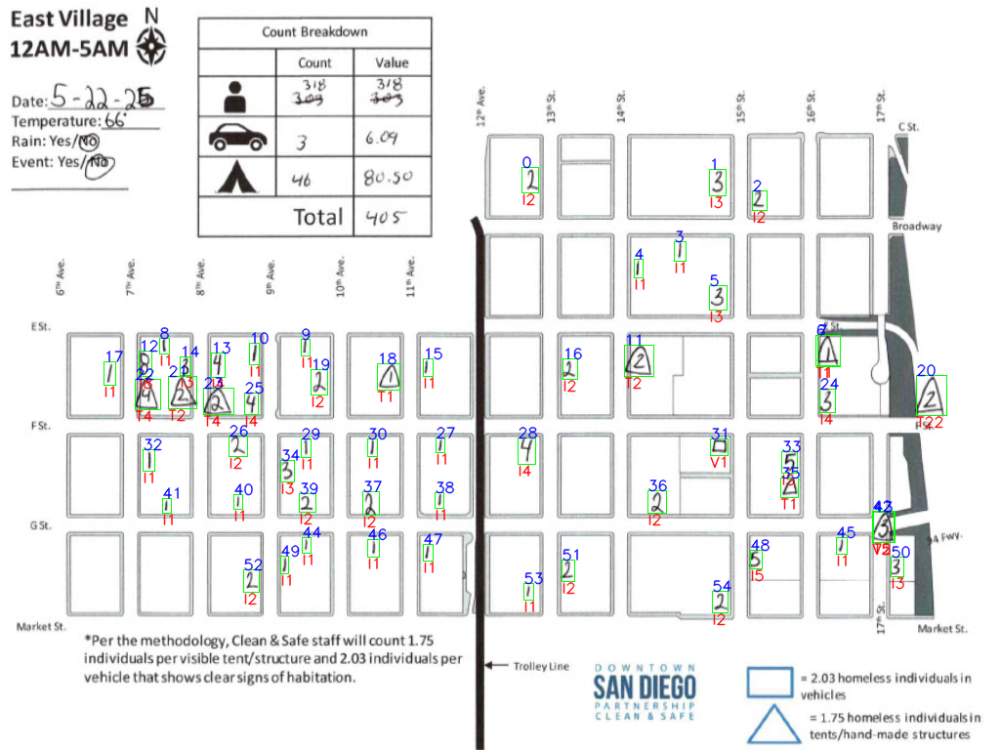

Processing EVS


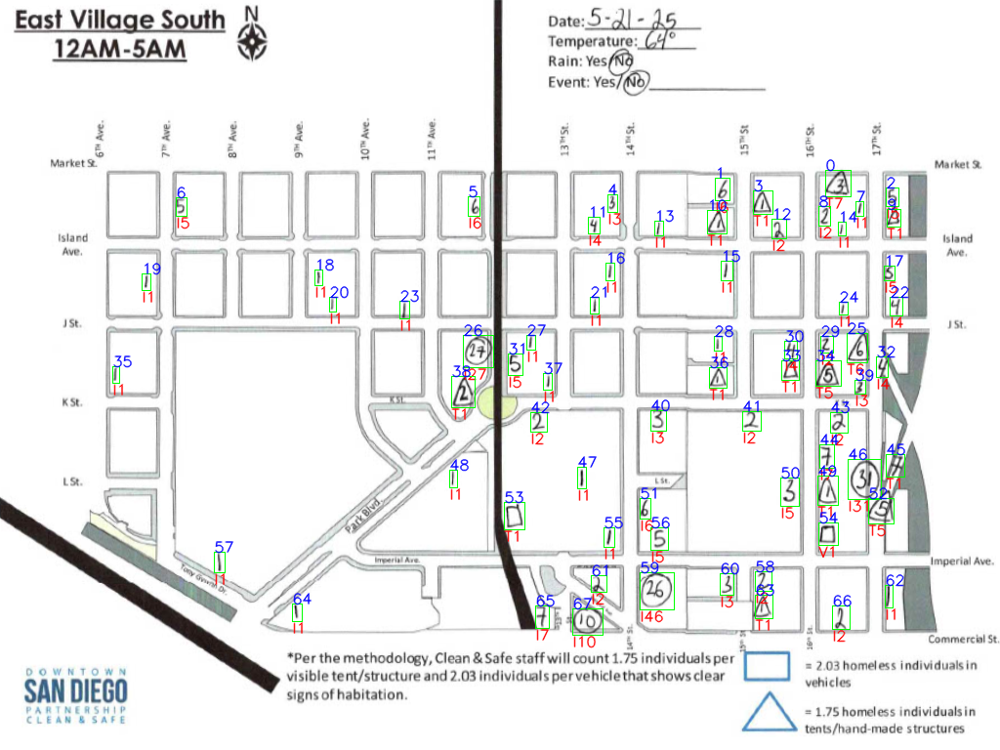

Processing GL


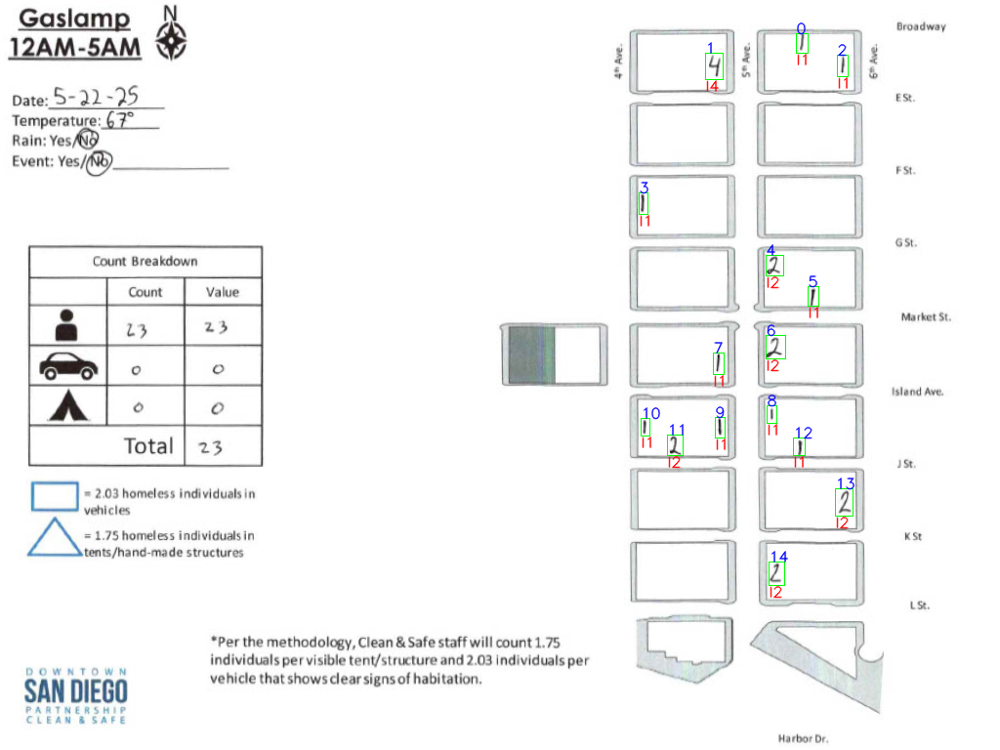

Processing M


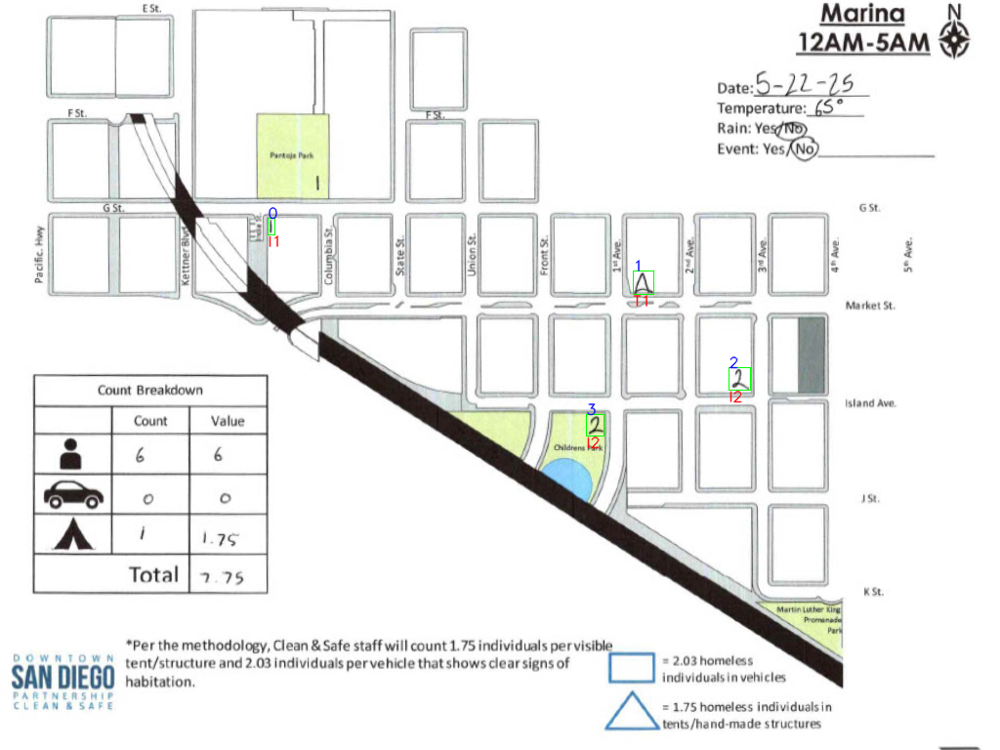

Processing TZ


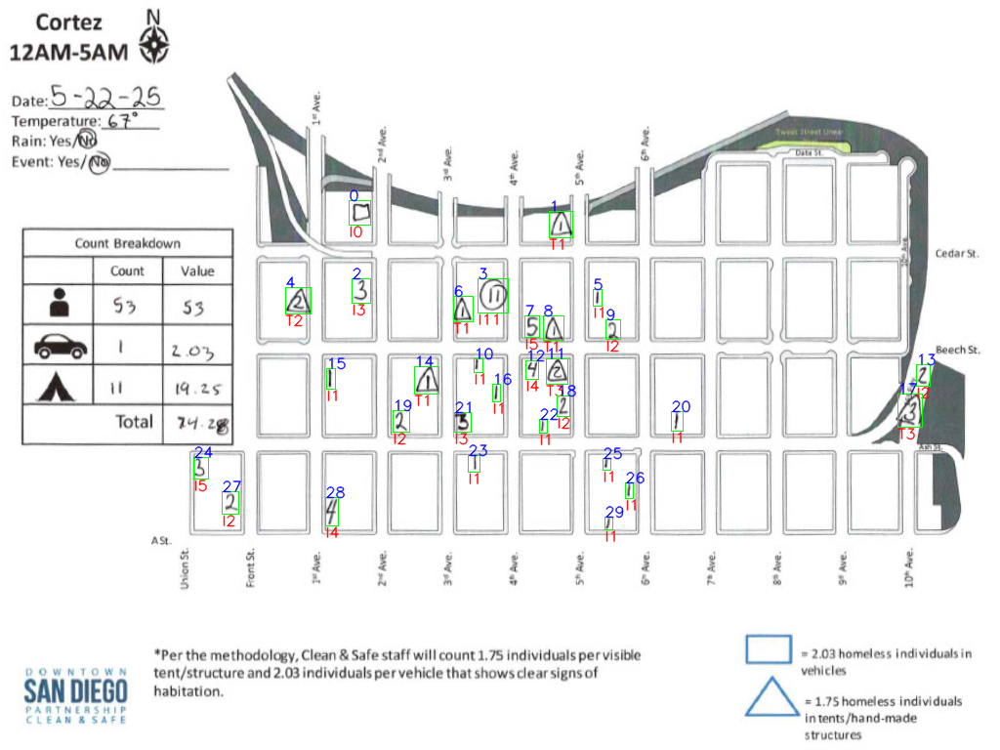

Processing CO


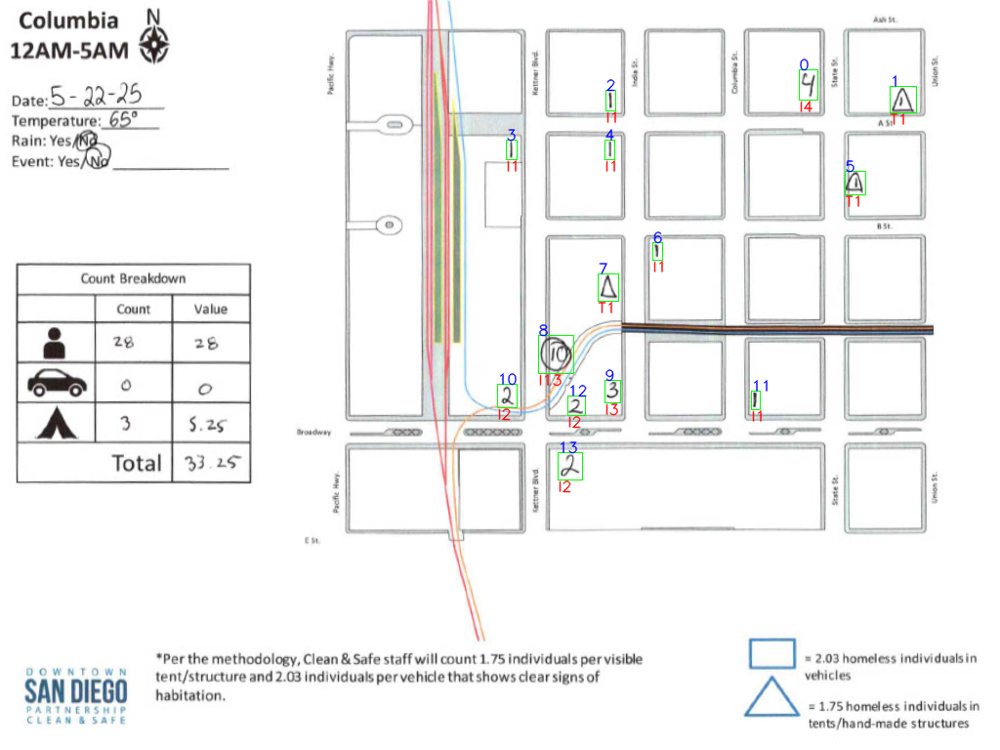

Processing BL


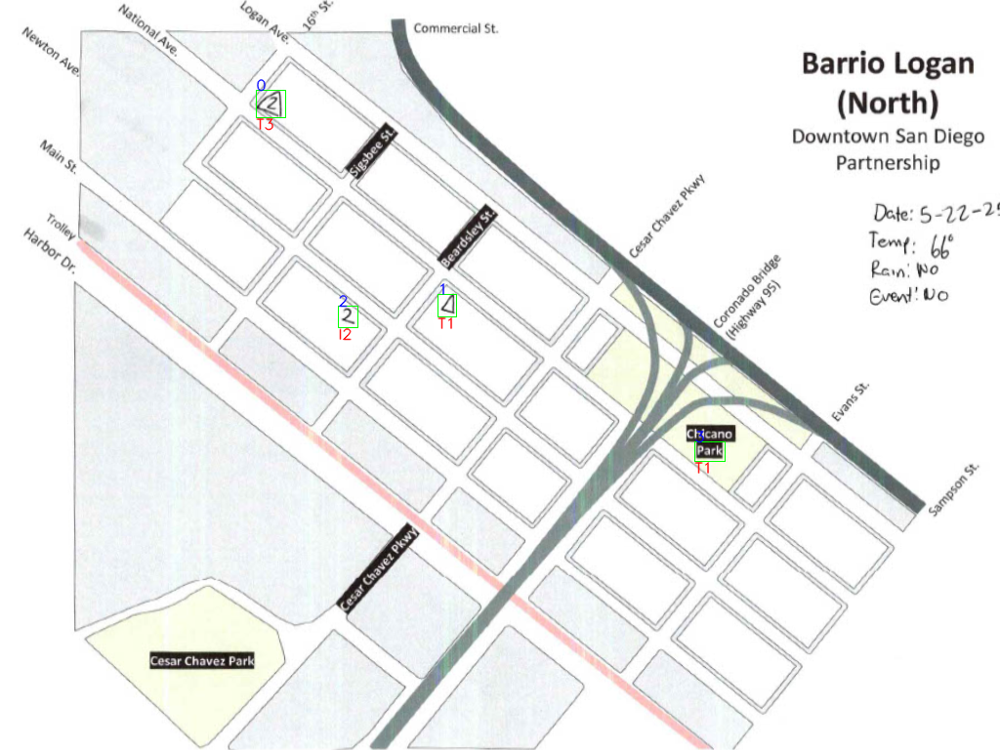

Processing GH


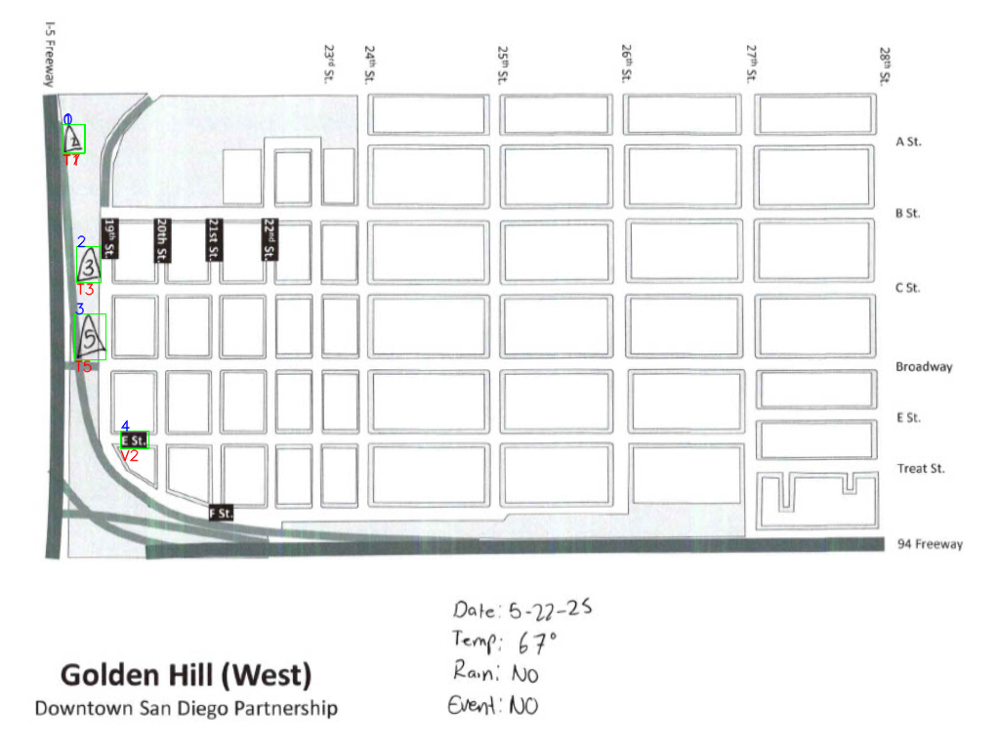

Processing CC


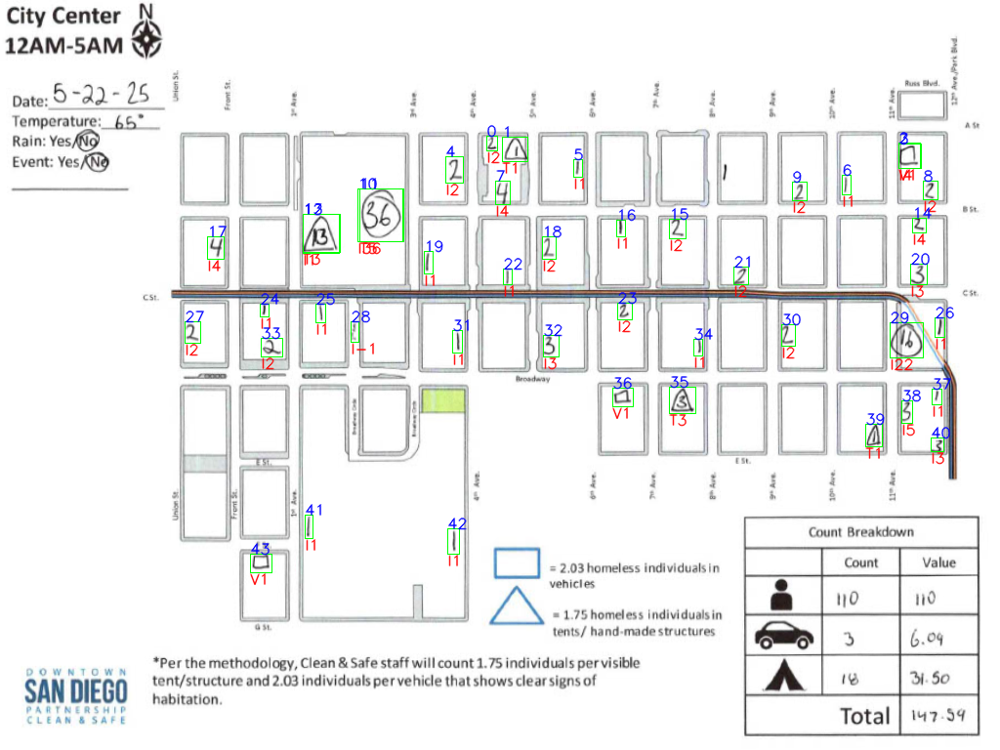

Processing SH


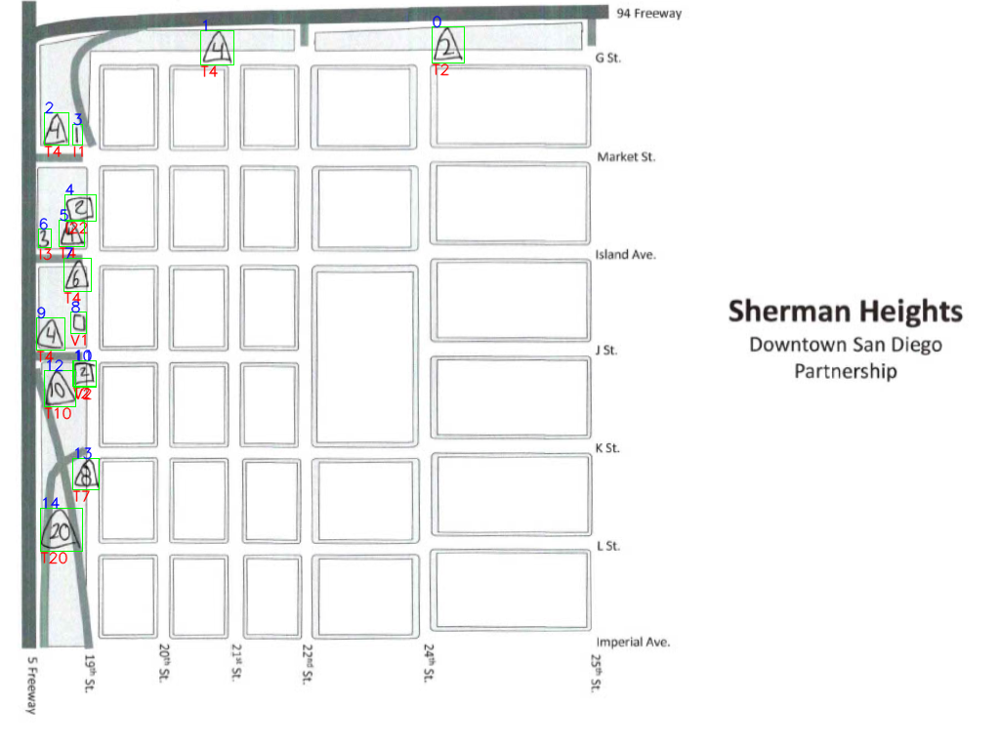

[[np.str_('EV'), 55], [np.str_('EVS'), 68], [np.str_('GL'), 15], [np.str_('M'), 4], [np.str_('TZ'), 30], [np.str_('CO'), 14], [np.str_('BL'), 4], [np.str_('GH'), 5], [np.str_('CC'), 44], [np.str_('SH'), 15]]


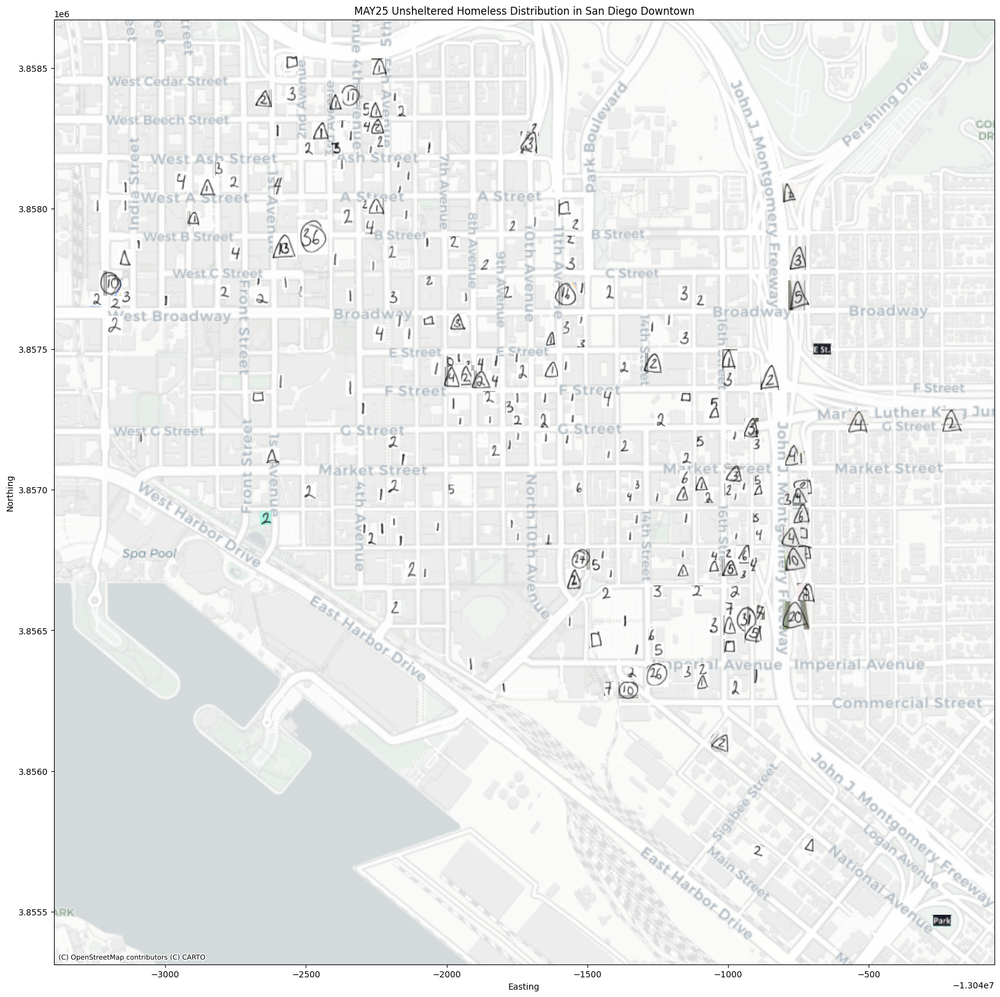

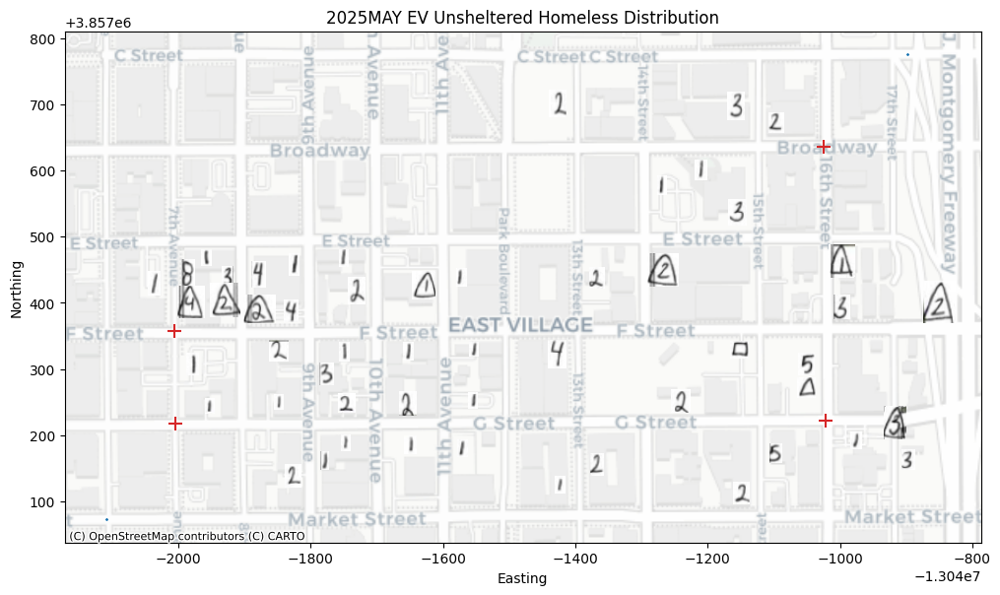

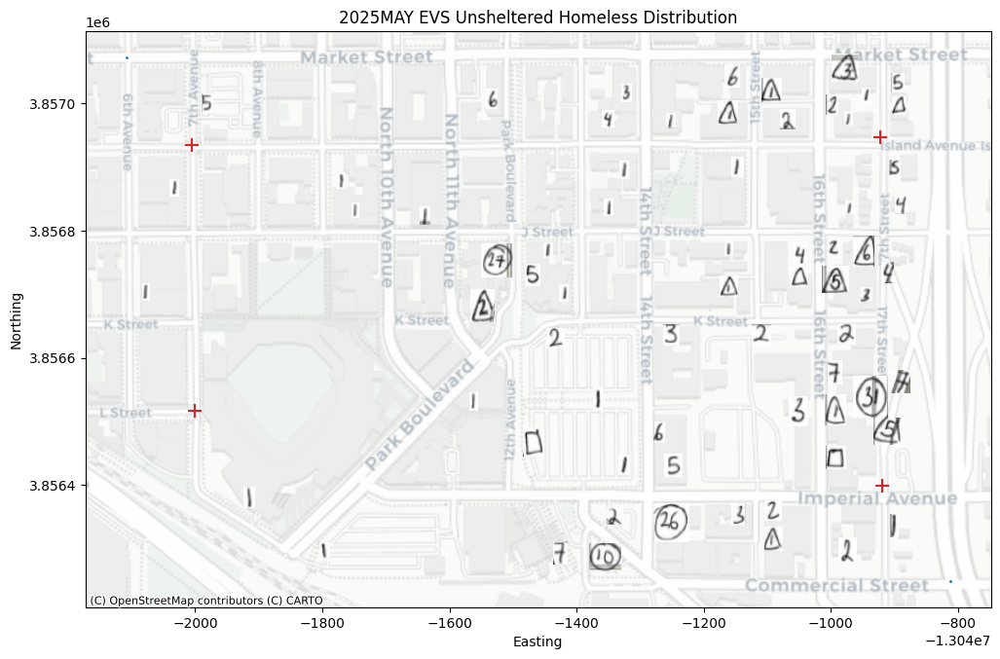

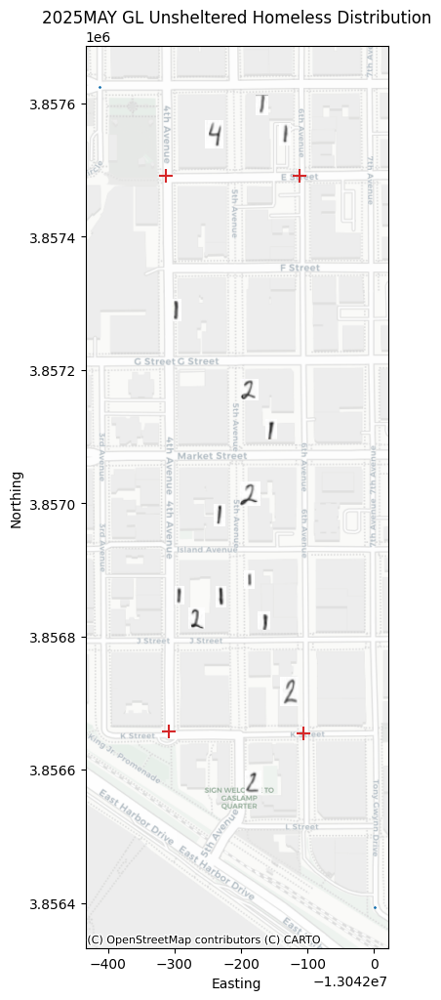

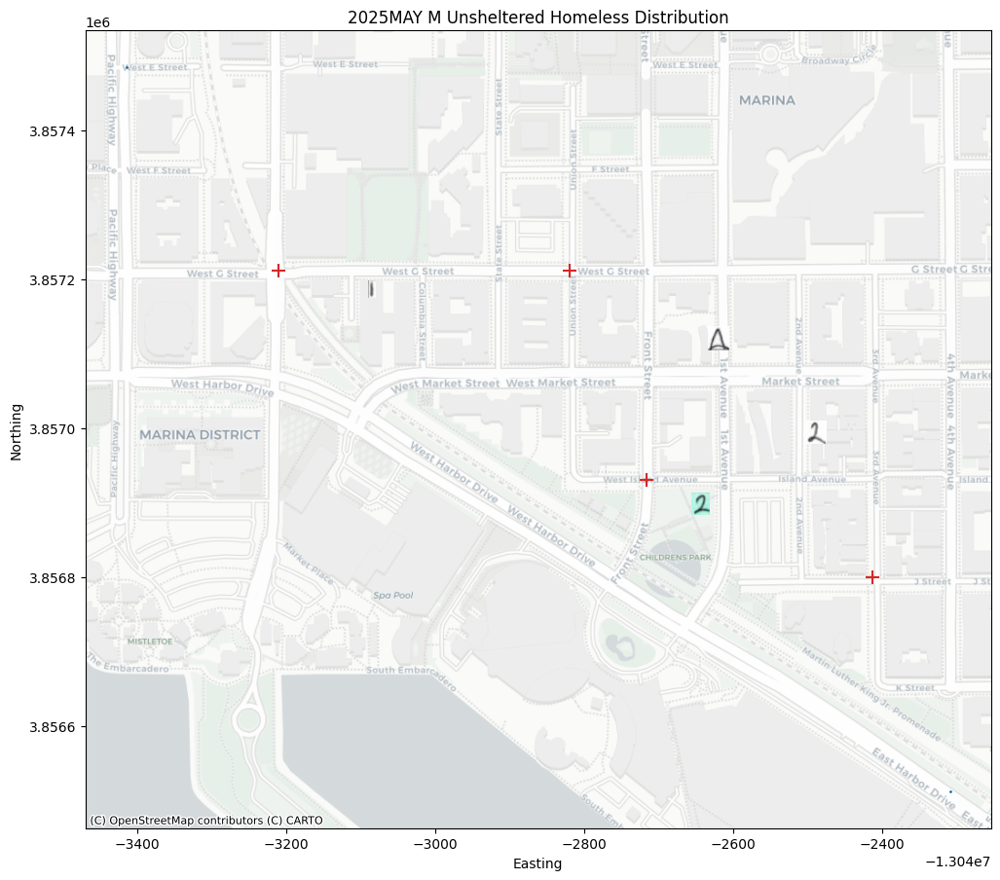

...

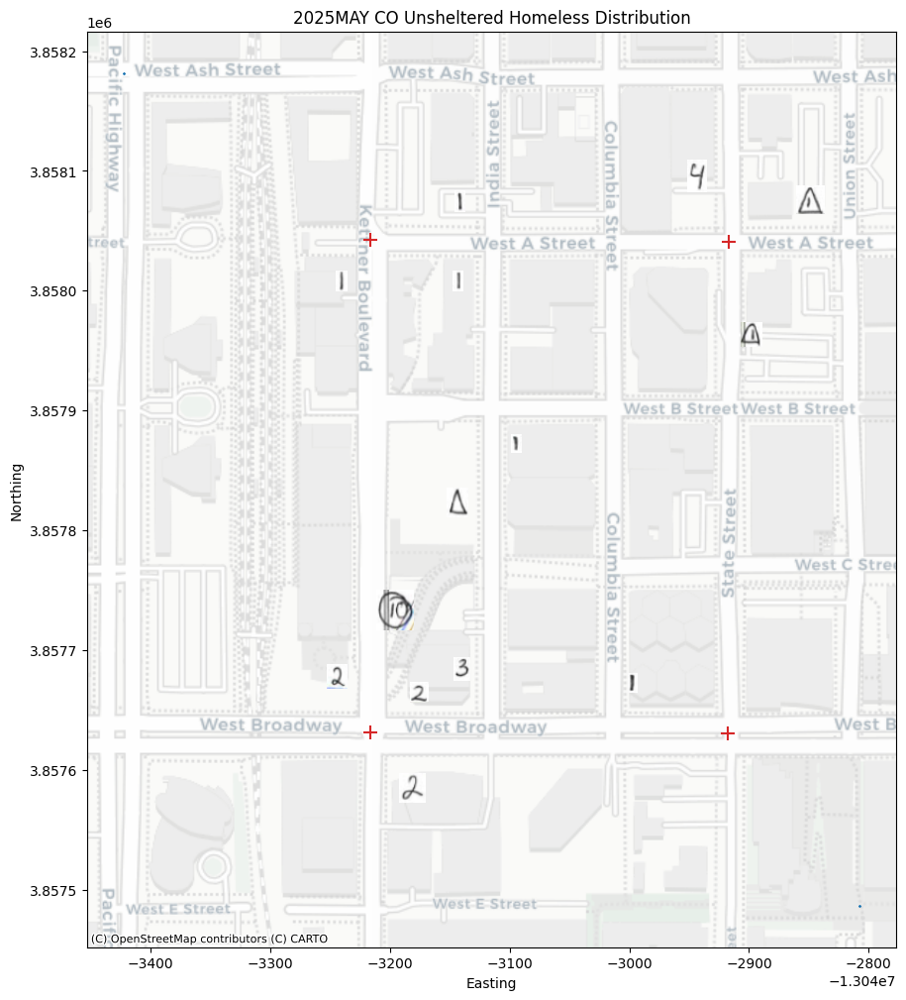

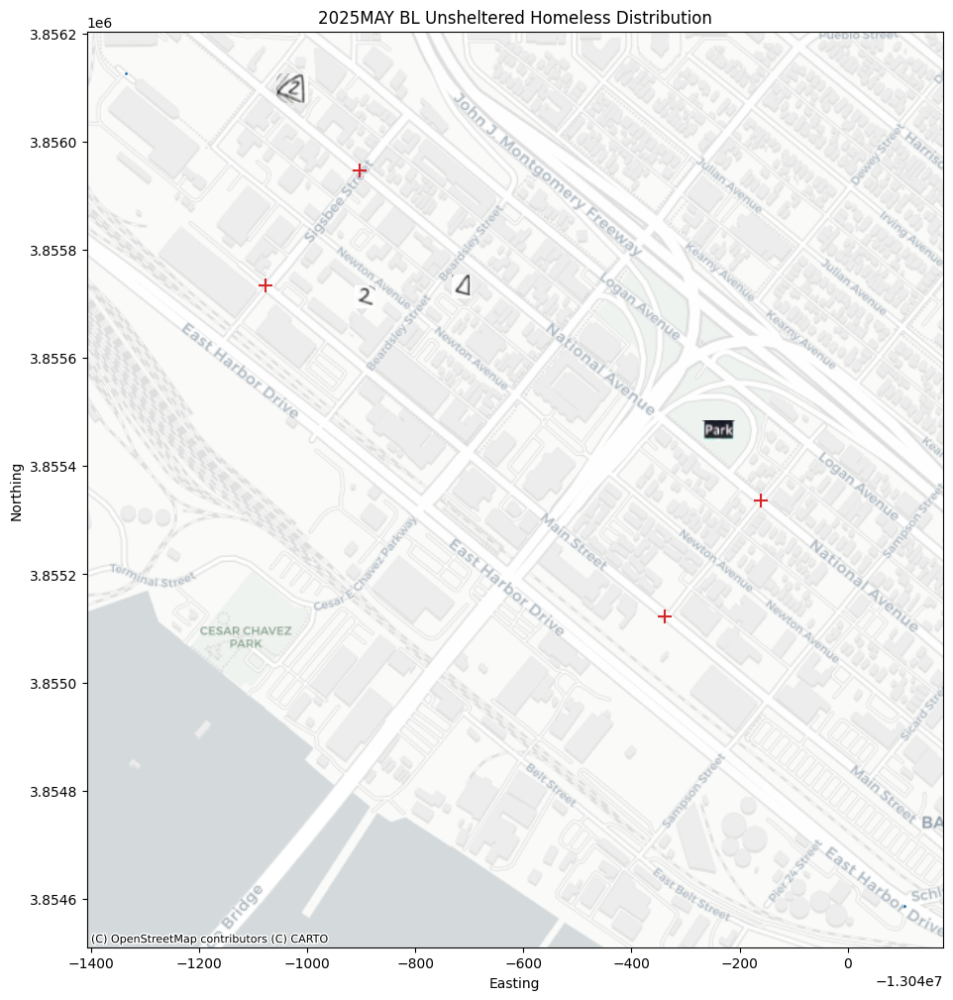

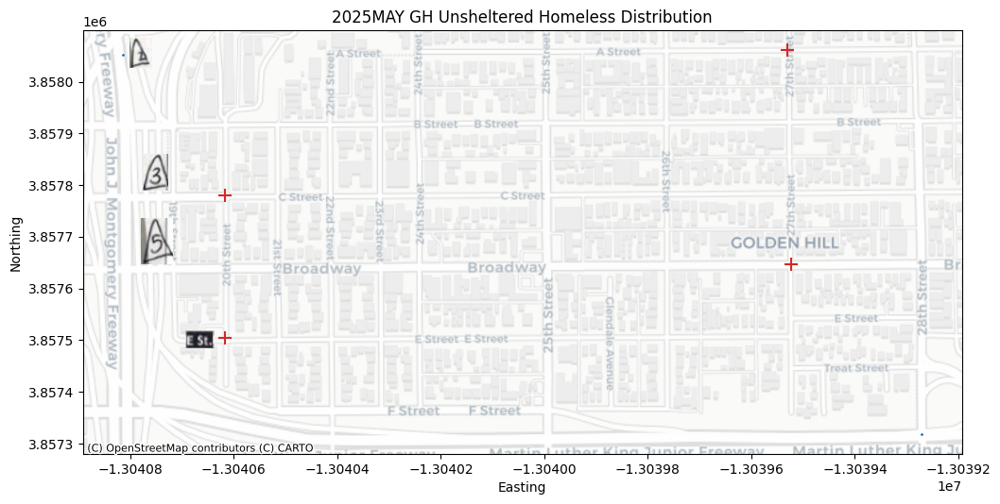

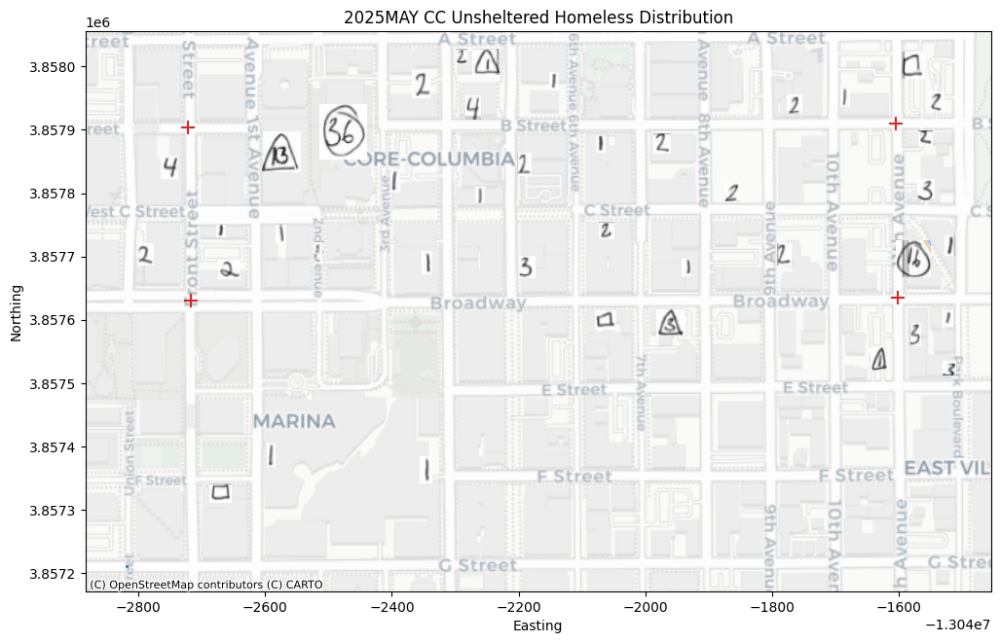

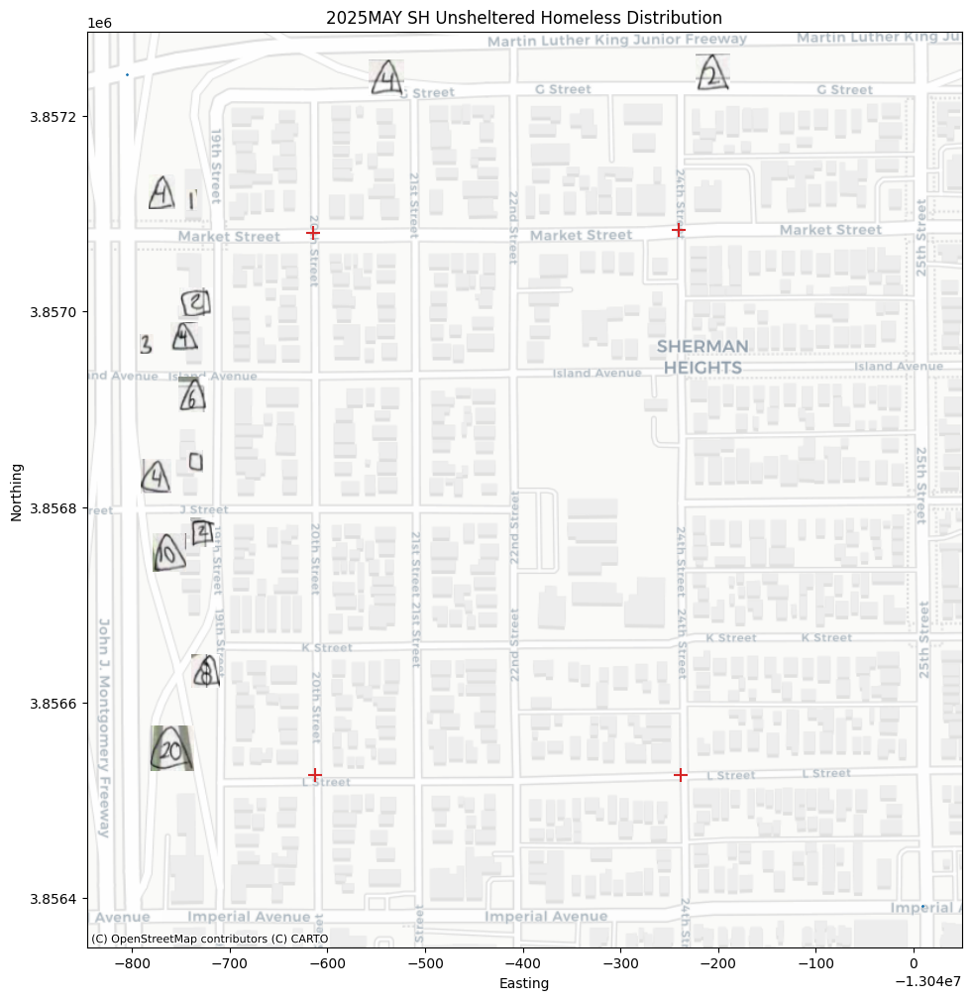

In [ ]:
################
### SETUP
###############

# Append the directory to python path using sys
mm = 'MAY'
yy = 2025
path = '/content/drive/MyDrive/'
mappingfolder = path + '/HomelessMappingFolder/'

sys.path.append(path)

geos = np.array(['EV', 'EVS', 'GL', 'M', 'TZ', 'CO', 'BL', 'GH', 'CC','SH'])

#Color palette
tc_plt = ['tab:red', 'tab:blue', 'tab:green', 'tab:orange', 'tab:purple', 'tab:olive', 'tab:cyan', 'tab:gray']
tc_rgb = [mc.to_rgb(c) for c in tc_plt]
tc_bgr = [tuple(int(x * 255) for x in reversed(c)) for c in tc_rgb]

df_gcp = pd.read_excel(mappingfolder+'LatestGCP.xlsx')
condition = (df_gcp['gcp_id'] != -1) & (df_gcp['gcp_id'] != 4)
condition2 = (df_gcp['gcp_id'] == -1) | (df_gcp['gcp_id'] == 4)
llc_AllGCP = df_gcp.loc[condition, ['gcpX', 'gcpY']].to_numpy()
llc_Allep = df_gcp.loc[condition2, ['gcpX', 'gcpY']].to_numpy()

dfAllGCP = pd.DataFrame(llc_AllGCP, columns=['X', 'Y'])
gdfAllGCP = gpd.GeoDataFrame(dfAllGCP, geometry=gpd.points_from_xy(dfAllGCP['X'], dfAllGCP['Y']), crs='EPSG:4326')
dfAllep = pd.DataFrame(llc_Allep, columns=['X', 'Y'])
gdfAllep = gpd.GeoDataFrame(dfAllep, geometry=gpd.points_from_xy(dfAllep['X'], dfAllep['Y']), crs='EPSG:4326')

fig2, ax2 = plt.subplots(figsize=(20, 20))
#gdfAllGCP.to_crs('EPSG:3857').plot(ax=ax2,marker = '+', markersize = 100, color = tc_plt[0])
#gdfAllep.to_crs('EPSG:3857').plot(ax=ax2,marker = '*', markersize = 1, color = tc_plt[1])

summary = []

df_GIS_columns = ['year', 'month', 'region', 'ID','BBx', 'BBy', 'BBw', 'BBh', 'Longitude', 'Latitude', 'Confidence', 'Type', 'Count', 'Valid', 'Missed']

df_GIS = pd.DataFrame(columns = df_GIS_columns)

for geo in geos:
  print('Processing '+ geo)
  geosummary = [geo]
  tfile = mappingfolder + 'Templates/T_'+geo+'.jpg'
  mfile = path+'Maps/'+str(yy)+'/'+str(yy)+'_'+mm+'/'+geo+'.jpg'
  cfile = mappingfolder + 'Config/T_'+geo+'.yaml'
  dfile = mappingfolder + 'Config/T_'+geo+'.txt'

  imgA, aligned, H, ipc_GCP, llc_GCP, llc_ep, bboxes, bboxesInMap = process_sections(tfile, mfile, cfile, dfile, df_gcp, geo)

  aligned, imgA, aGray, tGray, img3 =  align_imgs(tfile, mfile)
  image_copy1 = aligned.copy()
  image_copy2 = aligned.copy()

  test_ipc = []
  for bb in bboxesInMap:
    x,y,w,h,c,t = bb
    test_ipc.append([x+w/2, y+h/2])
  test_ipc = np.array(test_ipc)
  #if geo=='BL':
  #  test_ipc = test_ipc[1:]
  test_llc = cv2.perspectiveTransform(np.float32(test_ipc.reshape(-1, 1, 2)), H)

  font = cv2.FONT_HERSHEY_SIMPLEX
  font_scale = 0.5
  blue = (255, 0, 0)  # blue color (BGR format)
  red = (0,0,255)
  thickness = 1

  count = 0
  for i, bb in enumerate(bboxesInMap):
    x, y, w, h, c, t = bb
    cur_bb = analyze_bb(bb, aligned)
    #print(i)
    [x,y,w,h,t_out,n] = cur_bb
    rect = cv2.rectangle(image_copy1, (x , y), (x+w, y+h), (0, 255, 0), 1)
    cv2.putText(image_copy1,str(count), (x,y), font, font_scale, blue, thickness, cv2.LINE_AA)
    cv2.putText(image_copy1,t_out+str(n), (x,y+h+12), font, font_scale, red, thickness, cv2.LINE_AA)
    count += 1

    if t_out == 'T':
      t_out = 'Tent'
    elif t_out == 'I':
      t_out = 'Individual'
    elif t_out == 'V':
      t_out = 'Vehicle'
    else:
      t_out = 'Error'

    lon, lat = test_llc[i][0]

    new_row = {
        'year': yy,
        'month': mm,
        'region': geo,
        'ID': i,
        'BBx': x,
        'BBy': y,
        'BBw': w,
        'BBh': h,
        'Longitude': lon,
        'Latitude': lat,
        'Confidence': c,
        'Type': t_out,
        'Count': n,
        'Valid': 1,
        'Missed': 0
    }

    df_GIS.loc[len(df_GIS)] = new_row

  cv2.imwrite(mappingfolder+'Results/'+str(yy)+mm+geo+'bbInMap.jpg', image_copy1)
  geosummary.append(count)
  summary.append(geosummary)
  cv2_imshow(image_copy1)

  df_GIS.to_csv(mappingfolder+'Results/'+str(yy)+mm+'_homeless_count_data.csv', index = False)

  df = pd.DataFrame(test_llc.reshape(-1,2), columns=['X', 'Y'])
  gdf = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df['X'], df['Y']), crs='EPSG:4326')
  gdf_wm = gdf.to_crs('EPSG:3857')

  df1 = pd.DataFrame(llc_GCP, columns=['X', 'Y'])
  gdf1 = gpd.GeoDataFrame(df1, geometry=gpd.points_from_xy(df1['X'], df1['Y']), crs='EPSG:4326')

  df2 = pd.DataFrame(llc_ep, columns=['X', 'Y'])
  gdf2 = gpd.GeoDataFrame(df2, geometry=gpd.points_from_xy(df2['X'], df2['Y']), crs='EPSG:4326')

  s = 12
  fig, ax = plt.subplots(figsize=(s, s))
  gdf1.to_crs('EPSG:3857').plot(ax=ax,marker = '+', markersize = 100, color = tc_plt[0],figsize=(s,s))
  gdf2.to_crs('EPSG:3857').plot(ax=ax,marker = '*', markersize = 1, color = tc_plt[1])
  gdf_wm.plot(ax=ax, marker = '.',markersize =1,color = tc_plt[7])
  gdf_wm.plot(ax=ax2, marker = '.',markersize =1,color = tc_plt[7])


  # Iterate through your GeoDataFrame and add image markers
  for index, row in gdf_wm.iterrows():
    x, y = row.geometry.x, row.geometry.y
    xs,ys,w,h,c,t = bboxesInMap[index]
    img = aligned[ys:ys+h, xs:xs+w]
    #cv2_imshow(img)
    add_image_marker(ax, x, y, img, zoom=0.75)
    #if geo=='BL' and index == 0:
    # continue
    add_image_marker(ax2, x, y, img, zoom=0.75)  # Adjust zoom as needed

  cx.add_basemap(ax, source=cx.providers.CartoDB.Positron)
  # Add axis titles
  ax.set_xlabel("Easting")
  ax.set_ylabel("Northing")
  ax.set_title(str(yy)+mm+' '+geo+' Unsheltered Homeless Distribution')
  fname = mappingfolder+'Results/Map'+geo+'.jpg'
  #fig.savefig(fname)

cx.add_basemap(ax2, source=cx.providers.CartoDB.Positron)
# Add axis titles
ax2.set_xlabel("Easting")
ax2.set_ylabel("Northing")
ax2.set_title(mm+'25 Unsheltered Homeless Distribution in San Diego Downtown')
fig2.savefig(mappingfolder+'Results/'+str(yy)+mm+'DT.jpg')
print(summary)